In [2]:
# -*- coding: utf-8 -*-
"""Cat Breed Classification - Kaggle Dataset Version

Modified for JupyterLab/Anaconda with Kaggle dataset download.
Dataset: nikolasgegenava/cat-breeds 
Models: ResNet50, DenseNet121, MobileNetV3Small
"""

import sys
import subprocess
import json
import random
import shutil
import time
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from IPython.display import Image as DisplayImage, display
from PIL import Image, UnidentifiedImageError
from sklearn.metrics import accuracy_score, average_precision_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.applications import DenseNet121, MobileNetV3Small, ResNet50
from tensorflow.keras.applications.densenet import preprocess_input as densenet_preprocess
from tensorflow.keras.applications.mobilenet_v3 import preprocess_input as mobilenetv3_preprocess
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet50_preprocess

# Kaggle API for dataset download
import kagglehub

# Set random seeds for reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Configuration constants
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
EPOCHS = 50
IMAGES_PER_CLASS = 200  # ~200 images per class as requested
TRAIN_RATIO = 0.70
VALIDATION_RATIO = 0.15
TEST_RATIO = 0.15

# Print environment info
print("=" * 60)
print("CAT BREED CLASSIFICATION - KAGGLE DATASET VERSION")
print("=" * 60)
print(f"TensorFlow version: {tf.__version__}")
print(f"GPU available: {bool(tf.config.list_physical_devices('GPU'))}")
if tf.config.list_physical_devices('GPU'):
    print(f"GPU device: {tf.config.list_physical_devices('GPU')[0].name}")
print("=" * 60)

# Project directory structure (local paths for JupyterLab/Anaconda)
PROJECT_ROOT = Path('./project_results')
RAW_DIR = PROJECT_ROOT / 'raw_dataset'
DATASET_DIR = PROJECT_ROOT / 'dataset'
RESULTS_DIR = PROJECT_ROOT / 'results'
GRAPHS_DIR = RESULTS_DIR / 'graphs'
CONFUSION_DIR = RESULTS_DIR / 'confusion_matrices'
MODELS_DIR = PROJECT_ROOT / 'models'

# Create all directories
for folder in [PROJECT_ROOT, RAW_DIR, DATASET_DIR, RESULTS_DIR, GRAPHS_DIR, CONFUSION_DIR, MODELS_DIR]:
    folder.mkdir(parents=True, exist_ok=True)

print('\nProject folders created at:')
print(f"  Project Root: {PROJECT_ROOT.absolute()}")
print(f"  Dataset: {DATASET_DIR}")
print(f"  Results: {RESULTS_DIR}")


CAT BREED CLASSIFICATION - KAGGLE DATASET VERSION
TensorFlow version: 2.21.0
GPU available: False

Project folders created at:
  Project Root: C:\Users\muhab\AI-Image-Classification-Project\notebooks\project_results
  Dataset: project_results\dataset
  Results: project_results\results


C:\Users\muhab\anaconda3\envs\rocm_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
"""## 2. Download Kaggle Dataset And Select Top 10 Classes By Image Count"""

print("=" * 60)
print("STEP 2: DOWNLOADING KAGGLE DATASET")
print("=" * 60)

# Download the dataset using kagglehub
dataset_path = kagglehub.dataset_download("ramzanlafir/cat-breed-classification-11-classes")
print(f"Dataset downloaded to: {dataset_path}")

# The dataset is already extracted as folders - copy breed folders to RAW_DIR
downloaded_dir = Path(dataset_path)

# Find the actual data folder (kagglehub may create nested structure)
data_folder = None
for item in downloaded_dir.iterdir():
    if item.is_dir() and any(item.glob('*/*.jpg')):
        data_folder = item
        break
        
if data_folder is None:
    # Fallback: check for breed folders directly in downloaded_dir
    breed_folders = [d for d in downloaded_dir.iterdir() if d.is_dir()]
    if breed_folders:
        data_folder = downloaded_dir

print(f"\nData folder found at: {data_folder}")

# Copy all breed folders to RAW_DIR
for breed_folder in data_folder.iterdir():
    if breed_folder.is_dir() and not breed_folder.name.startswith('.'):
        dest_folder = RAW_DIR / breed_folder.name
        shutil.copytree(breed_folder, dest_folder)
        
print(f"\nDataset copied to: {RAW_DIR}")

# Count images per class across all 66 breeds
print("\nCounting images in each breed folder...")
class_image_counts = {}

for breed_folder in RAW_DIR.iterdir():
    if breed_folder.is_dir():
        # Count image files (common extensions)
        image_extensions = {'.jpg', '.jpeg', '.png', '.gif', '.bmp'}
        image_count = sum(1 for f in breed_folder.iterdir() 
                         if Path(f).suffix.lower() in image_extensions)
        class_image_counts[breed_folder.name] = image_count

# Convert to DataFrame and sort by count (descending)
counts_df = pd.DataFrame(list(class_image_counts.items()), columns=['breed', 'image_count'])
counts_df = counts_df.sort_values('image_count', ascending=False).reset_index(drop=True)

print(f"\nTotal breeds in dataset: {len(counts_df)}")
print("\nTop 15 breeds by image count:")
display(counts_df.head(15))

# Select top 10 classes with most images
TOP_N_CLASSES = 10
top_10_breeds = counts_df.head(TOP_N_CLASSES)['breed'].tolist()
top_10_counts = counts_df.head(TOP_N_CLASSES)['image_count'].tolist()

print(f"\n{'='*60}")
print(f"SELECTED TOP {TOP_N_CLASSES} CLASSES:")
print(f"{'='*60}")
for i, (breed, count) in enumerate(zip(top_10_breeds, top_10_counts), 1):
    print(f"{i}. {breed}: {count:,} images")

# Save selected classes info
selected_classes_info = dict(zip(top_10_breeds, top_10_counts))
with open(RESULTS_DIR / 'selected_classes.json', 'w') as f:
    json.dump(selected_classes_info, f, indent=2)

print(f"\nSelected classes saved to: {RESULTS_DIR / 'selected_classes.json'}")

# Store for later use in notebook
SELECTED_CLASSES = selected_classes_info
TOTAL_TARGET_IMAGES = sum(top_10_counts)

print(f"\nTotal images across top 10 classes: {TOTAL_TARGET_IMAGES:,}")


STEP 2: DOWNLOADING KAGGLE DATASET
Dataset downloaded to: C:\Users\muhab\.cache\kagglehub\datasets\ramzanlafir\cat-breed-classification-11-classes\versions\1

Data folder found at: C:\Users\muhab\.cache\kagglehub\datasets\ramzanlafir\cat-breed-classification-11-classes\versions\1\Cat_Breed

Dataset copied to: project_results\raw_dataset

Counting images in each breed folder...

Total breeds in dataset: 11

Top 15 breeds by image count:


,breed,image_count
0,Abyssinian,500
1,Bombay,500
2,Egyptian Mau,500
3,Exotic Shorthair,500
4,Himalayan,500
5,Maine Coon,500
6,Russian Blue,500
7,Siamese,500
8,Scottish Fold,500
9,Sphynx,500



SELECTED TOP 10 CLASSES:
1. Abyssinian: 500 images
2. Bombay: 500 images
3. Egyptian Mau: 500 images
4. Exotic Shorthair: 500 images
5. Himalayan: 500 images
6. Maine Coon: 500 images
7. Russian Blue: 500 images
8. Siamese: 500 images
9. Scottish Fold: 500 images
10. Sphynx: 500 images

Selected classes saved to: project_results\results\selected_classes.json

Total images across top 10 classes: 5,000


In [3]:
# Count images per class across all 66 breeds
print("\nCounting images in each breed folder...")
class_image_counts = {}

for breed_folder in RAW_DIR.iterdir():
    if breed_folder.is_dir():
        # Count image files (common extensions)
        image_extensions = {'.jpg', '.jpeg', '.png', '.gif', '.bmp'}
        image_count = sum(1 for f in breed_folder.iterdir() 
                         if Path(f).suffix.lower() in image_extensions)
        class_image_counts[breed_folder.name] = image_count

# Convert to DataFrame and sort by count (descending)
counts_df = pd.DataFrame(list(class_image_counts.items()), columns=['breed', 'image_count'])
counts_df = counts_df.sort_values('image_count', ascending=False).reset_index(drop=True)

print(f"\nTotal breeds in dataset: {len(counts_df)}")
print("\nTop 15 breeds by image count:")
display(counts_df.head(15))

# Select top 10 classes with most images
TOP_N_CLASSES = 10
top_10_breeds = counts_df.head(TOP_N_CLASSES)['breed'].tolist()
top_10_counts = counts_df.head(TOP_N_CLASSES)['image_count'].tolist()

print(f"\n{'='*60}")
print(f"SELECTED TOP {TOP_N_CLASSES} CLASSES:")
print(f"{'='*60}")
for i, (breed, count) in enumerate(zip(top_10_breeds, top_10_counts), 1):
    print(f"{i}. {breed}: {count:,} images")

# Save selected classes info
selected_classes_info = dict(zip(top_10_breeds, top_10_counts))
with open(RESULTS_DIR / 'selected_classes.json', 'w') as f:
    json.dump(selected_classes_info, f, indent=2)

print(f"\nSelected classes saved to: {RESULTS_DIR / 'selected_classes.json'}")

# Store for later use in notebook
SELECTED_CLASSES = selected_classes_info
TOTAL_TARGET_IMAGES = sum(top_10_counts)

print(f"\nTotal images across top 10 classes: {TOTAL_TARGET_IMAGES:,}")



Counting images in each breed folder...

Total breeds in dataset: 11

Top 15 breeds by image count:


,breed,image_count
0,Abyssinian,500
1,Bombay,500
2,Egyptian Mau,500
3,Exotic Shorthair,500
4,Himalayan,500
5,Maine Coon,500
6,Russian Blue,500
7,Siamese,500
8,Scottish Fold,500
9,Sphynx,500



SELECTED TOP 10 CLASSES:
1. Abyssinian: 500 images
2. Bombay: 500 images
3. Egyptian Mau: 500 images
4. Exotic Shorthair: 500 images
5. Himalayan: 500 images
6. Maine Coon: 500 images
7. Russian Blue: 500 images
8. Siamese: 500 images
9. Scottish Fold: 500 images
10. Sphynx: 500 images

Selected classes saved to: project_results\results\selected_classes.json

Total images across top 10 classes: 5,000


In [4]:
"""## 3. Clean Images Per Class"""

def is_valid_image(image_path):
    """Check if image file is valid and readable."""
    try:
        with Image.open(image_path) as img:
            img.verify()
        with Image.open(image_path) as img:
            img.convert('RGB')
        return True
    except Exception:
        return False

records = []
summary_rows = []

print("=" * 60)
print("STEP 3: CLEANING IMAGES")
print("=" * 60)

for class_name in SELECTED_CLASSES.keys():
    class_dir = RAW_DIR / class_name
    
    if not class_dir.exists():
        print(f"\nWARNING: Class folder '{class_name}' does not exist!")
        continue
        
    image_paths = sorted([p for p in class_dir.glob('*') if p.is_file()])

    valid_paths = []
    invalid_paths = []

    for image_path in image_paths:
        if is_valid_image(image_path):
            valid_paths.append(image_path)
        else:
            invalid_paths.append(image_path)

    # Keep only ~200 images per class (as requested)


    for image_path in valid_paths:
        records.append({'path': image_path, 'class_name': class_name})

    summary_rows.append({
        'class_name': class_name,
        'downloaded_files': len(image_paths),
        'valid_images_used': len(valid_paths),
        'invalid_images': len(invalid_paths),
    })
    
    print(f"\n{class_name}:")
    print(f"  Downloaded: {len(image_paths):,}")
    print(f"  Valid used: {len(valid_paths):,}")
    print(f"  Invalid: {len(invalid_paths):,}")

# Create DataFrames for records and summary
summary_df = pd.DataFrame(summary_rows)
df = pd.DataFrame(records)

# Save crawler summary to results folder
summary_df.to_csv(RESULTS_DIR / 'crawler_summary.csv', index=False)

print(f"\n{'='*60}")
print(f"Total valid images selected: {len(df):,}")
print(f"Target per class: ~{IMAGES_PER_CLASS}")
print(f"{'='*60}")

display(summary_df)

# Warning if fewer than expected images collected
expected_total = IMAGES_PER_CLASS * len(SELECTED_CLASSES)
if len(df) < expected_total:
    print(f"\nWARNING: Only {len(df):,} valid images collected.")
    print(f"Expected at least {expected_total:,} ({IMAGES_PER_CLASS} × {len(SELECTED_CLASSES)} classes).")
    print("Some classes may have fewer than 200 available images in the dataset.")


STEP 3: CLEANING IMAGES

Abyssinian:
  Downloaded: 500
  Valid used: 500
  Invalid: 0

Bombay:
  Downloaded: 500
  Valid used: 500
  Invalid: 0

Egyptian Mau:
  Downloaded: 500
  Valid used: 500
  Invalid: 0

Exotic Shorthair:
  Downloaded: 500
  Valid used: 500
  Invalid: 0

Himalayan:
  Downloaded: 500
  Valid used: 500
  Invalid: 0

Maine Coon:
  Downloaded: 500
  Valid used: 500
  Invalid: 0

Russian Blue:
  Downloaded: 500
  Valid used: 500
  Invalid: 0

Siamese:
  Downloaded: 500
  Valid used: 500
  Invalid: 0

Scottish Fold:
  Downloaded: 500
  Valid used: 500
  Invalid: 0

Sphynx:
  Downloaded: 500
  Valid used: 500
  Invalid: 0

Total valid images selected: 5,000
Target per class: ~200


,class_name,downloaded_files,valid_images_used,invalid_images
0,Abyssinian,500,500,0
1,Bombay,500,500,0
2,Egyptian Mau,500,500,0
3,Exotic Shorthair,500,500,0
4,Himalayan,500,500,0
5,Maine Coon,500,500,0
6,Russian Blue,500,500,0
7,Siamese,500,500,0
8,Scottish Fold,500,500,0
9,Sphynx,500,500,0


In [5]:
"""## 4. Create Training, Validation, And Testing Dataset Splits"""

print("=" * 60)
print("STEP 4: CREATING DATASET SPLITS")
print("=" * 60)

# First split: separate training from validation+test
train_df, temp_df = train_test_split(
    df,
    test_size=(VALIDATION_RATIO + TEST_RATIO),
    stratify=df['class_name'],
    random_state=SEED,
)

# Second split: separate validation from test
val_df, test_df = train_test_split(
    temp_df,
    test_size=TEST_RATIO / (VALIDATION_RATIO + TEST_RATIO),
    stratify=temp_df['class_name'],
    random_state=SEED,
)

# Store all splits in a dictionary for easy access
split_frames = {'train': train_df, 'validation': val_df, 'test': test_df}

print(f"\nSplit ratios: Train={TRAIN_RATIO:.0%}, Val={VALIDATION_RATIO:.0%}, Test={TEST_RATIO:.0%}")
print(f"Total images to split: {len(df):,}\n")

# Create directory structure for each split
for split_name in ['train', 'validation', 'test']:
    split_dir = DATASET_DIR / split_name
    if split_dir.exists():
        shutil.rmtree(split_dir)  # Remove existing folder if present

print("Creating dataset folders...")

for split_name, split_df in split_frames.items():
    for class_name in SELECTED_CLASSES.keys():
        (DATASET_DIR / split_name / class_name).mkdir(parents=True, exist_ok=True)

# Copy images to appropriate split folders and track paths
for split_name, split_df in split_frames.items():
    print(f"\nProcessing '{split_name}' split...")
    
    for _, row in split_df.iterrows():
        source_path = Path(row['path'])
        suffix = source_path.suffix.lower() if source_path.suffix else '.jpg'
        destination = DATASET_DIR / split_name / row['class_name'] / f'{source_path.stem}{suffix}'
        shutil.copy2(source_path, destination)

    # Export CSV tracking file for this split
    export_df = split_df.copy()
    export_df['path'] = export_df['path'].astype(str)
    export_df.to_csv(RESULTS_DIR / f'{split_name}_files.csv', index=False)

    print(f"  Images: {len(split_df):,}")
    print(f"  Distribution:")
    for class_name in sorted(SELECTED_CLASSES.keys()):
        count = len(split_df[split_df['class_name'] == class_name])
        print(f"    {class_name}: {count:,}")

print("\n" + "=" * 60)
print("DATASET SPLITS CREATED SUCCESSFULLY")
print("=" * 60)
print(f"\nDataset folders created at:")
print(f"  Train: {(DATASET_DIR / 'train').absolute()}")
print(f"  Validation: {(DATASET_DIR / 'validation').absolute()}")
print(f"  Test: {(DATASET_DIR / 'test').absolute}")

# Summary statistics
total_train = len(train_df)
total_val = len(val_df)
total_test = len(test_df)
print(f"\nSummary:")
print(f"  Training set: {total_train:,} images ({total_train/len(df)*100:.1f}% of total)")
print(f"  Validation set: {total_val:,} images ({total_val/len(df)*100:.1f}% of total)")
print(f"  Test set: {total_test:,} images ({total_test/len(df)*100:.1f}% of total)")


STEP 4: CREATING DATASET SPLITS

Split ratios: Train=70%, Val=15%, Test=15%
Total images to split: 5,000

Creating dataset folders...

Processing 'train' split...
  Images: 3,500
  Distribution:
    Abyssinian: 350
    Bombay: 350
    Egyptian Mau: 350
    Exotic Shorthair: 350
    Himalayan: 350
    Maine Coon: 350
    Russian Blue: 350
    Scottish Fold: 350
    Siamese: 350
    Sphynx: 350

Processing 'validation' split...
  Images: 750
  Distribution:
    Abyssinian: 75
    Bombay: 75
    Egyptian Mau: 75
    Exotic Shorthair: 75
    Himalayan: 75
    Maine Coon: 75
    Russian Blue: 75
    Scottish Fold: 75
    Siamese: 75
    Sphynx: 75

Processing 'test' split...
  Images: 750
  Distribution:
    Abyssinian: 75
    Bombay: 75
    Egyptian Mau: 75
    Exotic Shorthair: 75
    Himalayan: 75
    Maine Coon: 75
    Russian Blue: 75
    Scottish Fold: 75
    Siamese: 75
    Sphynx: 75

DATASET SPLITS CREATED SUCCESSFULLY

Dataset folders created at:
  Train: C:\Users\muhab\AI-Image-C

STEP 5: VISUALIZING DATASET

Generating class distribution chart...


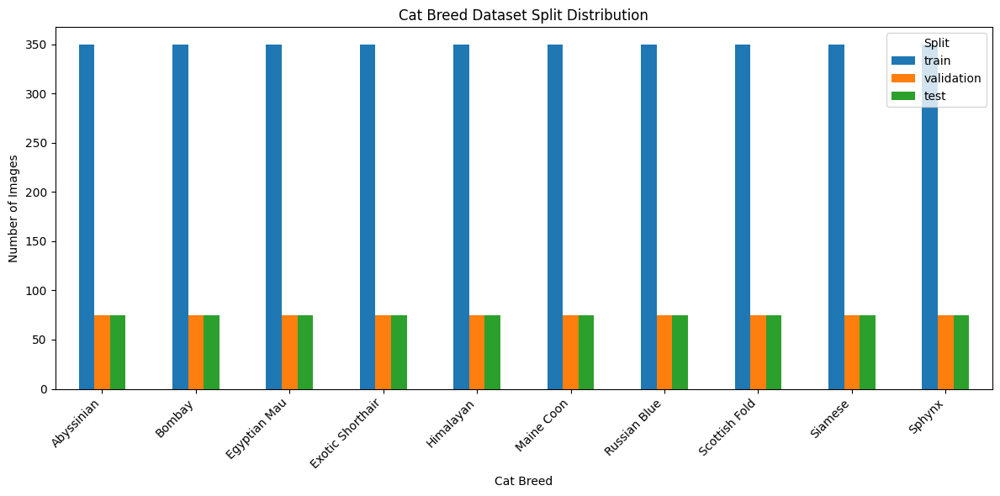

Distribution chart saved to: project_results\results\graphs\class_distribution.png


split,train,validation,test
class_name,,,
Abyssinian,350,75,75
Bombay,350,75,75
Egyptian Mau,350,75,75
Exotic Shorthair,350,75,75
Himalayan,350,75,75
Maine Coon,350,75,75
Russian Blue,350,75,75
Scottish Fold,350,75,75
Siamese,350,75,75



Generating sample images visualization...


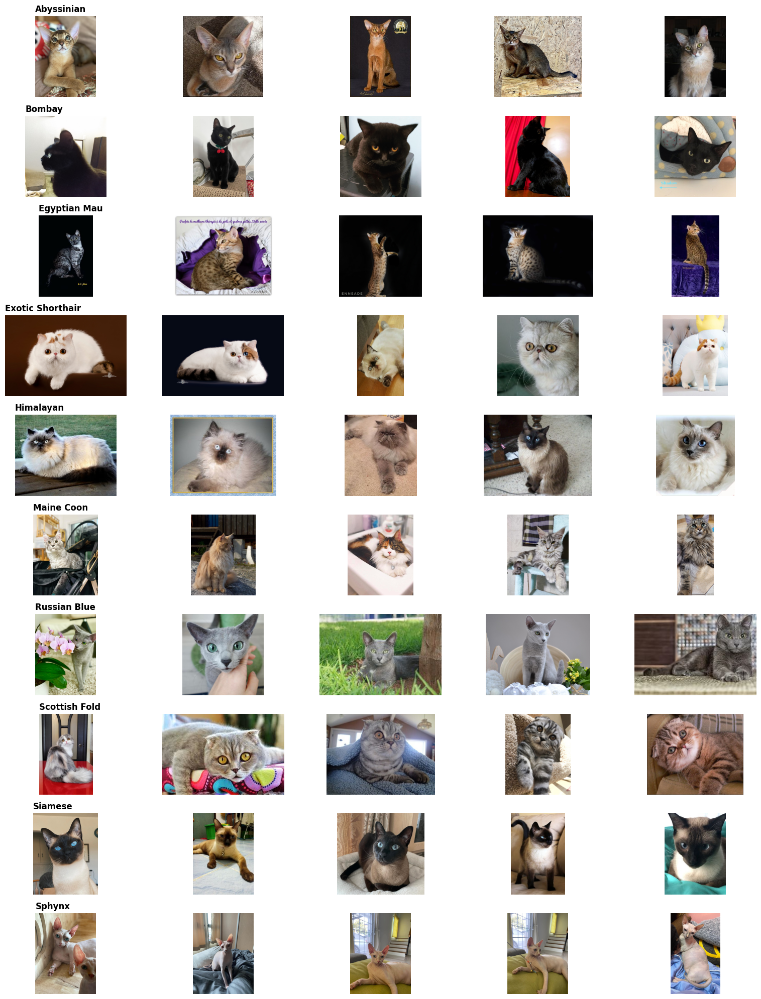

Sample images saved to: project_results\results\graphs\sample_cat_breeds.png

DATASET VISUALIZATION COMPLETE

Classes in dataset: 10
  Abyssinian: 500 images total
  Bombay: 500 images total
  Egyptian Mau: 500 images total
  Exotic Shorthair: 500 images total
  Himalayan: 500 images total
  Maine Coon: 500 images total
  Russian Blue: 500 images total
  Scottish Fold: 500 images total
  Siamese: 500 images total
  Sphynx: 500 images total


In [6]:
"""## 5. Visualize Dataset"""

print("=" * 60)
print("STEP 5: VISUALIZING DATASET")
print("=" * 60)

# Create distribution DataFrame for plotting
distribution_rows = []
for split_name, split_df in split_frames.items():
    counts = split_df['class_name'].value_counts().sort_index()
    for class_name, count in counts.items():
        distribution_rows.append({'split': split_name, 'class_name': class_name, 'count': count})

distribution_df = pd.DataFrame(distribution_rows)
distribution_pivot = distribution_df.pivot(index='class_name', columns='split', values='count')
distribution_pivot = distribution_pivot[['train', 'validation', 'test']]

# Plot 1: Class Distribution Bar Chart
print("\nGenerating class distribution chart...")
ax = distribution_pivot.plot(kind='bar', figsize=(12, 6))
ax.set_title('Cat Breed Dataset Split Distribution')
ax.set_xlabel('Cat Breed')
ax.set_ylabel('Number of Images')
ax.legend(title='Split')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig(GRAPHS_DIR / 'class_distribution.png', dpi=150)
plt.show()

print("Distribution chart saved to:", GRAPHS_DIR / 'class_distribution.png')
display(distribution_pivot)

# Plot 2: Sample Images Grid (5 images per class)
print("\nGenerating sample images visualization...")
fig, axes = plt.subplots(len(SELECTED_CLASSES), 5, figsize=(16, len(SELECTED_CLASSES) * 2))

for row_idx, class_name in enumerate(sorted(SELECTED_CLASSES.keys())):
    class_images = list((DATASET_DIR / 'train' / class_name).glob('*'))
    
    if len(class_images) < 5:
        sample_images = class_images  # Use all available if less than 5
    else:
        sample_images = random.sample(class_images, 5)
    
    for col_idx, image_path in enumerate(sample_images):
        try:
            image = Image.open(image_path).convert('RGB')
            axes[row_idx, col_idx].imshow(image)
            axes[row_idx, col_idx].axis('off')
            
            # Add class name as title on first column only
            if col_idx == 0:
                axes[row_idx, col_idx].set_title(class_name, loc='left', fontsize=12, fontweight='bold')
        except Exception as e:
            print(f"Warning: Could not load image {image_path}: {e}")

plt.tight_layout()
plt.savefig(GRAPHS_DIR / 'sample_cat_breeds.png', dpi=150)
plt.show()

print("Sample images saved to:", GRAPHS_DIR / 'sample_cat_breeds.png')

# Print summary statistics
print("\n" + "=" * 60)
print("DATASET VISUALIZATION COMPLETE")
print("=" * 60)
print(f"\nClasses in dataset: {len(SELECTED_CLASSES)}")
for class_name, count in sorted(SELECTED_CLASSES.items()):
    print(f"  {class_name}: {count:,} images total")


In [7]:
"""## 6. Load TensorFlow Datasets"""

print("=" * 60)
print("STEP 6: LOADING TENSORFLOW DATASETS")
print("=" * 60)

# Create tf.data datasets from directory structure
train_ds = tf.keras.utils.image_dataset_from_directory(
    DATASET_DIR / 'train',
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=True,
    seed=SEED,
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    DATASET_DIR / 'validation',
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=False,
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    DATASET_DIR / 'test',
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=False,
)

# Get class names from training dataset
class_names = train_ds.class_names
num_classes = len(class_names)

print(f"\nNumber of classes: {num_classes}")
print(f"Class names: {class_names}")

# Enable prefetching for performance optimization
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.prefetch(AUTOTUNE)
val_ds = val_ds.prefetch(AUTOTUNE)
test_ds = test_ds.prefetch(AUTOTUNE)

print("\n" + "=" * 60)
print("DATASETS LOADED SUCCESSFULLY")
print("=" * 60)
print(f"\nDataset configuration:")
print(f"  Image size: {IMG_SIZE}")
print(f"  Batch size: {BATCH_SIZE}")
print(f"  Number of classes: {num_classes}")
print(f"  Training batches per epoch: {len(train_ds)}")
print(f"  Validation batches: {len(val_ds)}")
print(f"  Test batches: {len(test_ds)}")

# Verify dataset by showing one sample batch
print("\nVerifying dataset with sample batch...")
for images, labels in train_ds.take(1):
    print(f"  Images shape: {images.shape}")
    print(f"  Labels shape: {labels.shape}")
    print(f"  Sample label (one-hot): {labels[0].numpy()}")
    break

print("\nReady for model training!")


STEP 6: LOADING TENSORFLOW DATASETS
Found 3500 files belonging to 10 classes.
Found 750 files belonging to 10 classes.
Found 750 files belonging to 10 classes.

Number of classes: 10
Class names: ['Abyssinian', 'Bombay', 'Egyptian Mau', 'Exotic Shorthair', 'Himalayan', 'Maine Coon', 'Russian Blue', 'Scottish Fold', 'Siamese', 'Sphynx']

DATASETS LOADED SUCCESSFULLY

Dataset configuration:
  Image size: (224, 224)
  Batch size: 32
  Number of classes: 10
  Training batches per epoch: 110
  Validation batches: 24
  Test batches: 24

Verifying dataset with sample batch...
  Images shape: (32, 224, 224, 3)
  Labels shape: (32, 10)
  Sample label (one-hot): [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]

Ready for model training!


In [8]:
"""## 7. Model Training And Evaluation Functions"""

def build_transfer_model(model_key, base_class, preprocess_fn, include_preprocessing=None):
    """Build a transfer learning model with data augmentation."""
    
    # Data augmentation layers for training
    data_augmentation = tf.keras.Sequential([
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.08),
        layers.RandomZoom(0.10),
    ], name=f"{model_key}_augmentation")

    # Base model configuration
    base_kwargs = {
        "weights": "imagenet",
        "include_top": False,
        "input_shape": IMG_SIZE + (3,),
    }
    
    if include_preprocessing is not None:
        base_kwargs["include_preprocessing"] = include_preprocessing

    # Load pre-trained base model
    base_model = base_class(**base_kwargs)
    base_model.trainable = False  # Freeze base layers initially

    # Build the complete model
    inputs = layers.Input(shape=IMG_SIZE + (3,))
    x = data_augmentation(inputs)
    x = preprocess_fn(x)
    x = base_model(x, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dropout(0.30)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = models.Model(inputs, outputs, name=f"{model_key}_cat_breed_classifier")
    
    # Compile the model
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss="categorical_crossentropy",
        metrics=["accuracy"],
    )
    
    return model


def plot_history(history_df, model_label, model_key):
    """Plot and save training history graphs."""
    
    # Accuracy graph
    plt.figure(figsize=(8, 5))
    plt.plot(history_df["accuracy"], label="Training Accuracy", linewidth=2)
    plt.plot(history_df["val_accuracy"], label="Validation Accuracy", linewidth=2)
    plt.title(f"{model_label} Training And Validation Accuracy")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(GRAPHS_DIR / f"{model_key}_accuracy.png", dpi=150)
    plt.show()

    # Loss graph
    plt.figure(figsize=(8, 5))
    plt.plot(history_df["loss"], label="Training Loss", linewidth=2)
    plt.plot(history_df["val_loss"], label="Validation Loss", linewidth=2)
    plt.title(f"{model_label} Training And Validation Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(GRAPHS_DIR / f"{model_key}_loss.png", dpi=150)
    plt.show()


def evaluate_model(model, model_label, model_key, history, training_time_seconds):
    """Evaluate trained model and save all metrics."""
    
    # Convert history to DataFrame and save
    history_df = pd.DataFrame(history.history)
    history_df.to_csv(RESULTS_DIR / f"{model_key}_history.csv", index=False)
    
    # Plot training graphs
    plot_history(history_df, model_label, model_key)

    # Evaluate on test set
    print(f"\nEvaluating {model_label} on test set...")
    test_loss, test_accuracy = model.evaluate(test_ds)

    # Get predictions for detailed metrics
    y_true = []
    y_prob = []
    for images, labels in test_ds:
        predictions = model.predict(images, verbose=0)
        y_prob.append(predictions)
        y_true.append(labels.numpy())

    y_true = np.vstack(y_true)
    y_prob = np.vstack(y_prob)
    y_true_labels = np.argmax(y_true, axis=1)
    y_pred_labels = np.argmax(y_prob, axis=1)

    # Calculate metrics
    accuracy_from_predictions = accuracy_score(y_true_labels, y_pred_labels)
    mean_average_precision = average_precision_score(y_true, y_prob, average="macro")

    # Confusion matrix
    cm = confusion_matrix(y_true_labels, y_pred_labels)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", 
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"{model_label} Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.savefig(CONFUSION_DIR / f"{model_key}_confusion_matrix.png", dpi=150)
    plt.show()

    # Classification report
    report = classification_report(y_true_labels, y_pred_labels, 
                                   target_names=class_names, output_dict=True)
    pd.DataFrame(report).transpose().to_csv(RESULTS_DIR / f"{model_key}_classification_report.csv")

    # Count model parameters
    trainable_params = int(np.sum([np.prod(v.shape) for v in model.trainable_weights]))
    non_trainable_params = int(np.sum([np.prod(v.shape) for v in model.non_trainable_weights]))
    total_params = trainable_params + non_trainable_params

    # Compile all metrics into dictionary
    metrics = {
        "model": model_label,
        "dataset": "Kaggle cat-breeds dataset - Top 10 classes",
        "classes": class_names,
        "epochs_requested": EPOCHS,
        "epochs_completed": len(history_df),
        "test_loss": float(test_loss),
        "test_accuracy": float(test_accuracy),
        "test_accuracy_from_predictions": float(accuracy_from_predictions),
        "mean_average_precision_macro": float(mean_average_precision),
        "training_time_seconds": float(training_time_seconds),
        "training_time_minutes": float(training_time_seconds / 60),
        "total_params": total_params,
        "trainable_params": trainable_params,
        "non_trainable_params": non_trainable_params,
    }

    # Save metrics to JSON file
    with open(RESULTS_DIR / f"{model_key}_metrics.json", "w") as f:
        json.dump(metrics, f, indent=2)

    print(f"\n{model_label} Metrics:")
    print(f"  Test Accuracy: {test_accuracy:.4f}")
    print(f"  mAP (macro): {mean_average_precision:.4f}")
    print(f"  Training Time: {training_time_seconds/60:.2f} minutes")
    print(f"  Total Parameters: {total_params:,}")

    return metrics


def train_and_evaluate(model_key, model_label, base_class, preprocess_fn, include_preprocessing=None):
    """Train a model and evaluate it."""
    
    print("\n" + "=" * 60)
    print(f"TRAINING {model_label}")
    print("=" * 60)
    
    # Clear session to free memory
    tf.keras.backend.clear_session()
    
    # Build the model
    model = build_transfer_model(model_key, base_class, preprocess_fn, include_preprocessing)
    model.summary()

    # Callbacks for training
    callbacks = [
        ModelCheckpoint(
            filepath=MODELS_DIR / f"{model_key}_cat_breed.keras",
            monitor="val_accuracy",
            save_best_only=True,
            mode="max",
            verbose=1,
        ),
        ReduceLROnPlateau(
            monitor="val_loss",
            factor=0.3,
            patience=5,
            min_lr=1e-7,
            verbose=1,
        ),
    ]

    # Train the model
    start_time = time.time()
    history = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, callbacks=callbacks)
    training_time_seconds = time.time() - start_time

    print(f"\nTraining completed in {training_time_seconds/60:.2f} minutes")

    # Evaluate the trained model
    return evaluate_model(model, model_label, model_key, history, training_time_seconds)



TRAINING ResNet50



Model: "resnet50_cat_breed_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)    │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ resnet50_augmentation         │ (None, 224, 224, 3)       │               0 │ input_layer_1[0][0]        │
│ (Sequential)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ get_item (GetItem)            │ (None, 224, 224)          │               0 │ resnet50_augmentation[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ get_item_1 (GetItem)          │ (None, 224, 224)          │               0 │ resnet50_augmentation[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ get_item_2 (GetItem)          │ (None, 224, 224)          │               0 │ resnet50_augmentation[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stack (Stack)                 │ (None, 224, 224, 3)       │               0 │ get_item[0][0],            │
│                               │                           │                 │ get_item_1[0][0],          │
│                               │                           │                 │ get_item_2[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ add (Add)                     │ (None, 224, 224, 3)       │               0 │ stack[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ resnet50 (Functional)         │ (None, 7, 7, 2048)        │      23,587,712 │ add[0][0]                  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ global_average_pooling2d      │ (None, 2048)              │               0 │ resnet50[0][0]             │
│ (GlobalAveragePooling2D)      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout (Dropout)             │ (None, 2048)              │               0 │ global_average_pooling2d[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense (Dense)                 │ (None, 10)                │          20,490 │ dropout[0][0]              │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 23,608,202 (90.06 MB)

 Trainable params: 20,490 (80.04 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 548ms/step - accuracy: 0.1809 - loss: 2.4269
Epoch 1: val_accuracy improved from None to 0.53733, saving model to project_results\models\resnet50_cat_breed.keras

Epoch 1: finished saving model to project_results\models\resnet50_cat_breed.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 78s 676ms/step - accuracy: 0.2554 - loss: 2.1663 - val_accuracy: 0.5373 - val_loss: 1.4783 - learning_rate: 1.0000e-04
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.4641 - loss: 1.5535
Epoch 2: val_accuracy improved from 0.53733 to 0.73867, saving model to project_results\models\resnet50_cat_breed.keras

Epoch 2: finished saving model to project_results\models\resnet50_cat_breed.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 71s 649ms/step - accuracy: 0.5171 - loss: 1.4230 - val_accuracy: 0.7387 - val_loss: 1.0003 - learning_rate: 1.0000e-04
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 531ms/step - accuracy: 0.6502 - loss: 1.1033
Epoch 3: val_accuracy improved from 0

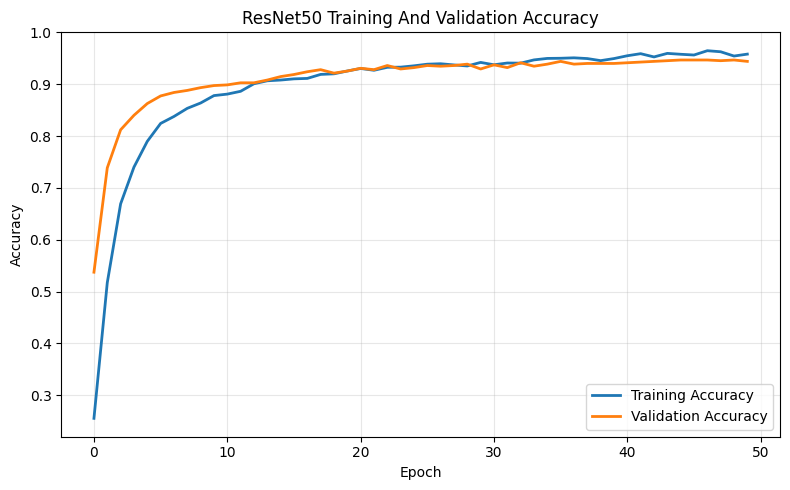

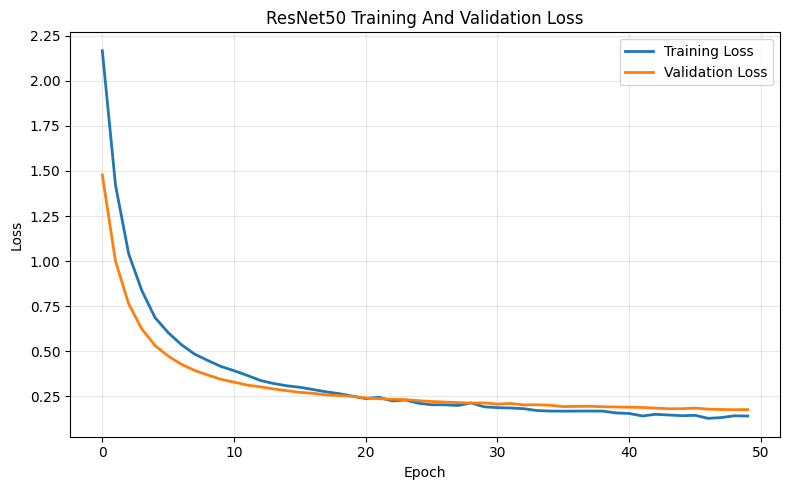


Evaluating ResNet50 on test set...
24/24 ━━━━━━━━━━━━━━━━━━━━ 12s 487ms/step - accuracy: 0.9560 - loss: 0.1326


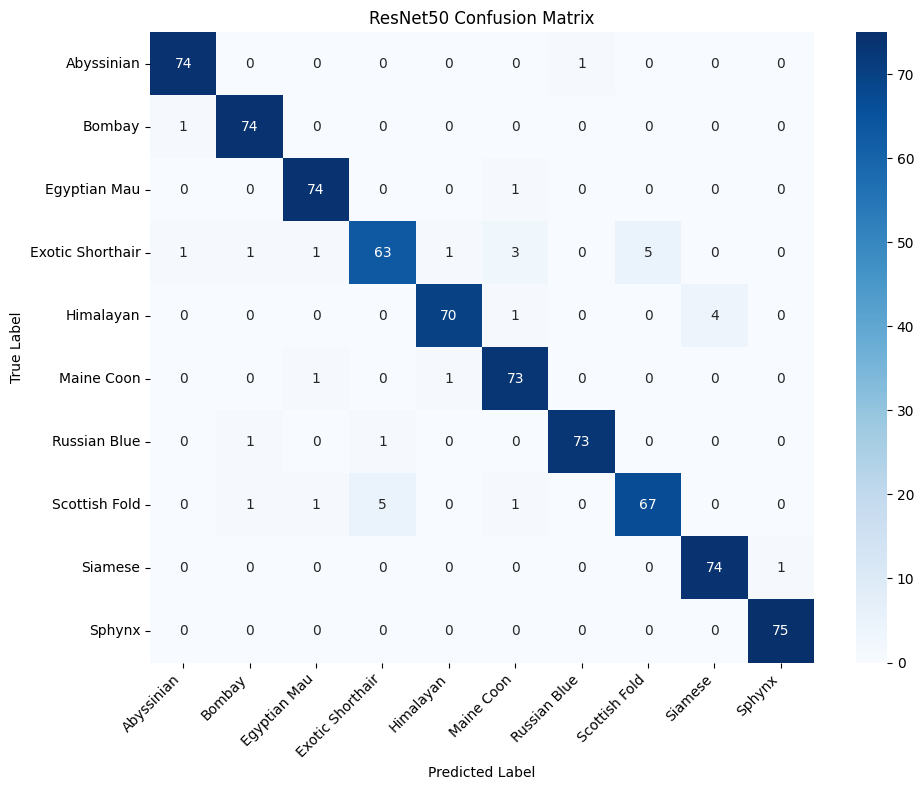


ResNet50 Metrics:
  Test Accuracy: 0.9560
  mAP (macro): 0.9902
  Training Time: 59.50 minutes
  Total Parameters: 23,608,202


In [10]:
"""## 8. Train ResNet50"""

resnet50_metrics = train_and_evaluate(
    model_key="resnet50",
    model_label="ResNet50",
    base_class=ResNet50,
    preprocess_fn=resnet50_preprocess,
)



TRAINING DenseNet121


Model: "densenet121_cat_breed_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ densenet121_augmentation             │ (None, 224, 224, 3)         │               0 │
│ (Sequential)                         │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ true_divide (TrueDivide)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ add (Add)                            │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ true_divide_1 (TrueDivide)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ densenet121 (Functional)             │ (None, 7, 7, 1024)          │       7,037,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 10)                  │          10,250 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,047,754 (26.89 MB)

 Trainable params: 10,250 (40.04 KB)

 Non-trainable params: 7,037,504 (26.85 MB)

Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 524ms/step - accuracy: 0.1304 - loss: 2.6923
Epoch 1: val_accuracy improved from None to 0.28667, saving model to project_results\models\densenet121_cat_breed.keras

Epoch 1: finished saving model to project_results\models\densenet121_cat_breed.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 78s 656ms/step - accuracy: 0.1631 - loss: 2.5074 - val_accuracy: 0.2867 - val_loss: 1.9763 - learning_rate: 1.0000e-04
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 519ms/step - accuracy: 0.2349 - loss: 2.1626
Epoch 2: val_accuracy improved from 0.28667 to 0.46800, saving model to project_results\models\densenet121_cat_breed.keras

Epoch 2: finished saving model to project_results\models\densenet121_cat_breed.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 70s 631ms/step - accuracy: 0.2660 - loss: 2.0699 - val_accuracy: 0.4680 - val_loss: 1.6316 - learning_rate: 1.0000e-04
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 514ms/step - accuracy: 0.3590 - loss: 1.8321
Epoch 3: val_accuracy imp

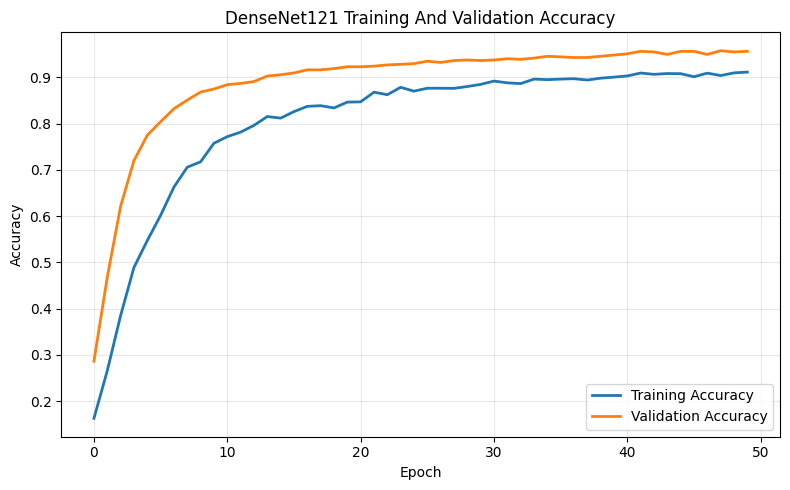

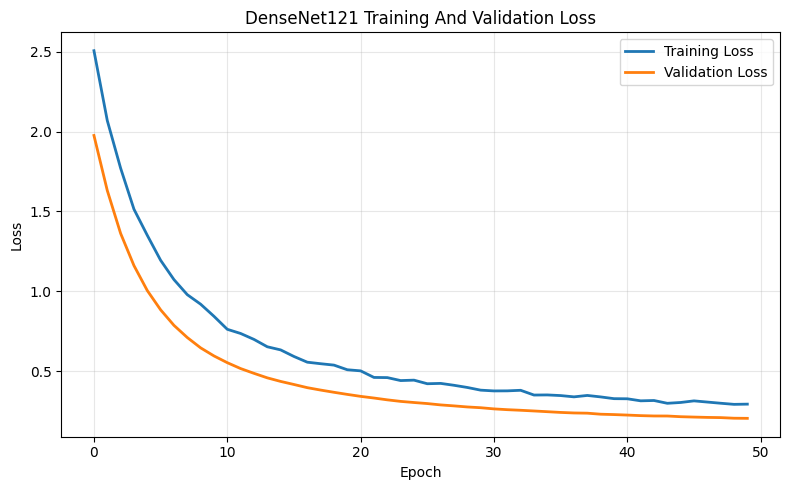


Evaluating DenseNet121 on test set...
24/24 ━━━━━━━━━━━━━━━━━━━━ 13s 528ms/step - accuracy: 0.9480 - loss: 0.1803


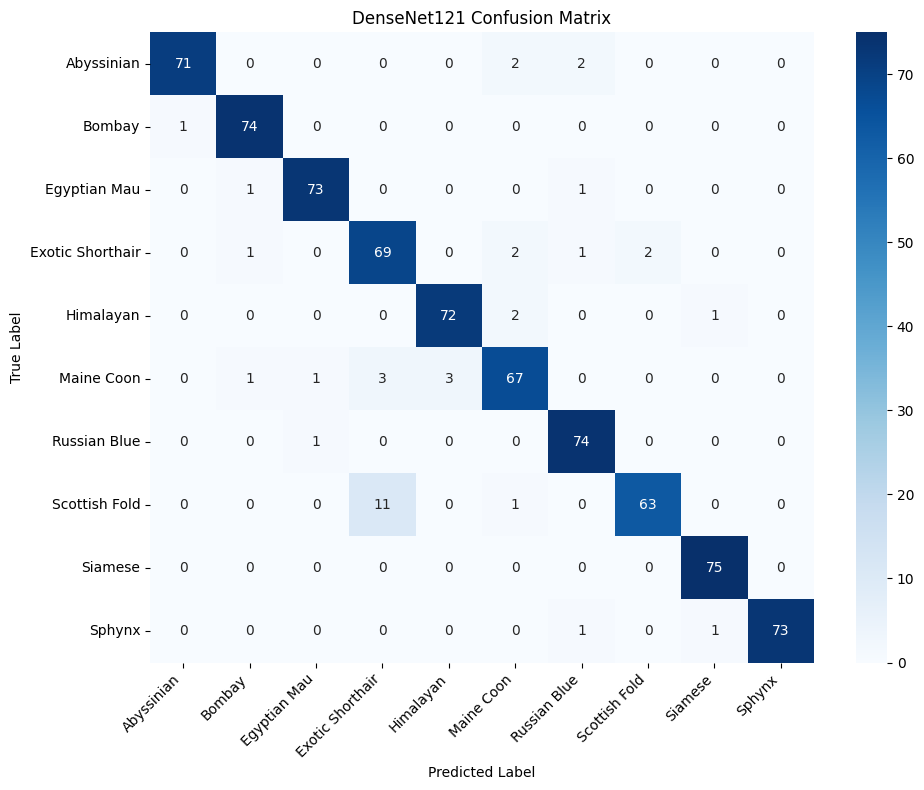


DenseNet121 Metrics:
  Test Accuracy: 0.9480
  mAP (macro): 0.9888
  Training Time: 61.38 minutes
  Total Parameters: 7,047,754


In [11]:
"""## 9. Train DenseNet121"""

densenet121_metrics = train_and_evaluate(
    model_key="densenet121",
    model_label="DenseNet121",
    base_class=DenseNet121,
    preprocess_fn=densenet_preprocess,
)



TRAINING MobileNetV3Small


Model: "mobilenetv3_cat_breed_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv3_augmentation             │ (None, 224, 224, 3)         │               0 │
│ (Sequential)                         │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ MobileNetV3Small (Functional)        │ (None, 7, 7, 576)           │         939,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 576)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 576)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 10)                  │           5,770 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 944,890 (3.60 MB)

 Trainable params: 5,770 (22.54 KB)

 Non-trainable params: 939,120 (3.58 MB)

Epoch 1/50
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.1098 - loss: 2.7655
Epoch 1: val_accuracy improved from None to 0.23867, saving model to project_results\models\mobilenetv3_cat_breed.keras

Epoch 1: finished saving model to project_results\models\mobilenetv3_cat_breed.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 15s 109ms/step - accuracy: 0.1271 - loss: 2.6149 - val_accuracy: 0.2387 - val_loss: 2.1105 - learning_rate: 1.0000e-04
Epoch 2/50
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.1966 - loss: 2.3449
Epoch 2: val_accuracy improved from 0.23867 to 0.42533, saving model to project_results\models\mobilenetv3_cat_breed.keras

Epoch 2: finished saving model to project_results\models\mobilenetv3_cat_breed.keras
110/110 ━━━━━━━━━━━━━━━━━━━━ 11s 101ms/step - accuracy: 0.2191 - loss: 2.2327 - val_accuracy: 0.4253 - val_loss: 1.7837 - learning_rate: 1.0000e-04
Epoch 3/50
109/110 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.2822 - loss: 1.9945
Epoch 3: val_accuracy improv

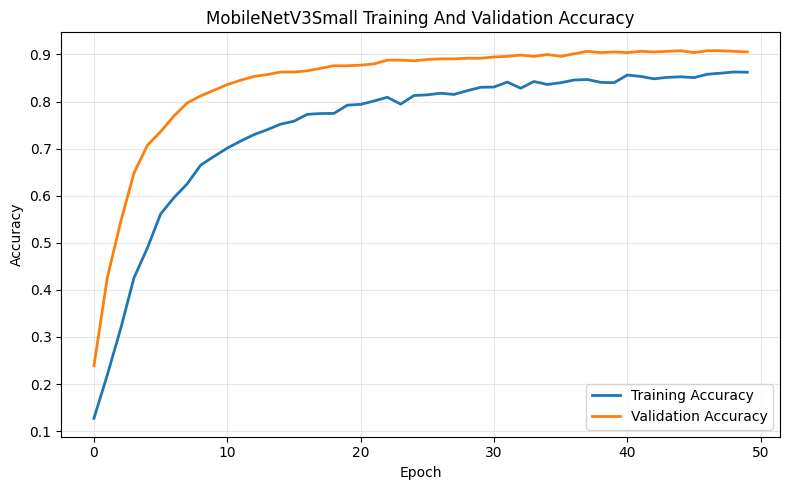

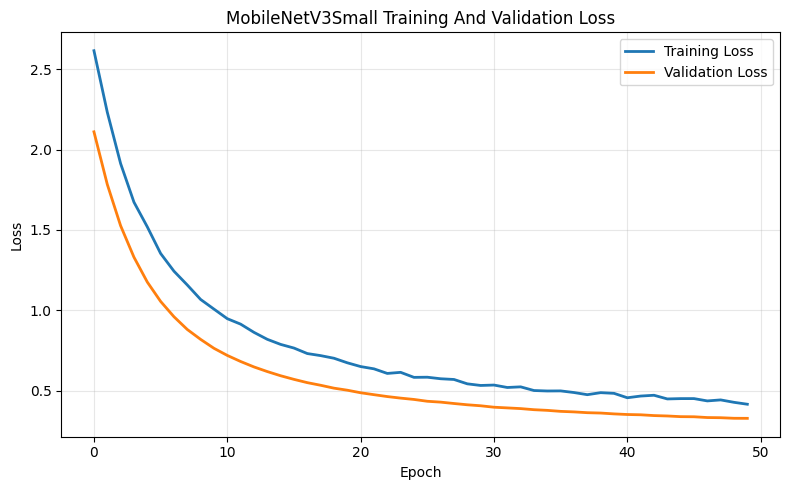


Evaluating MobileNetV3Small on test set...
24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.9107 - loss: 0.3245


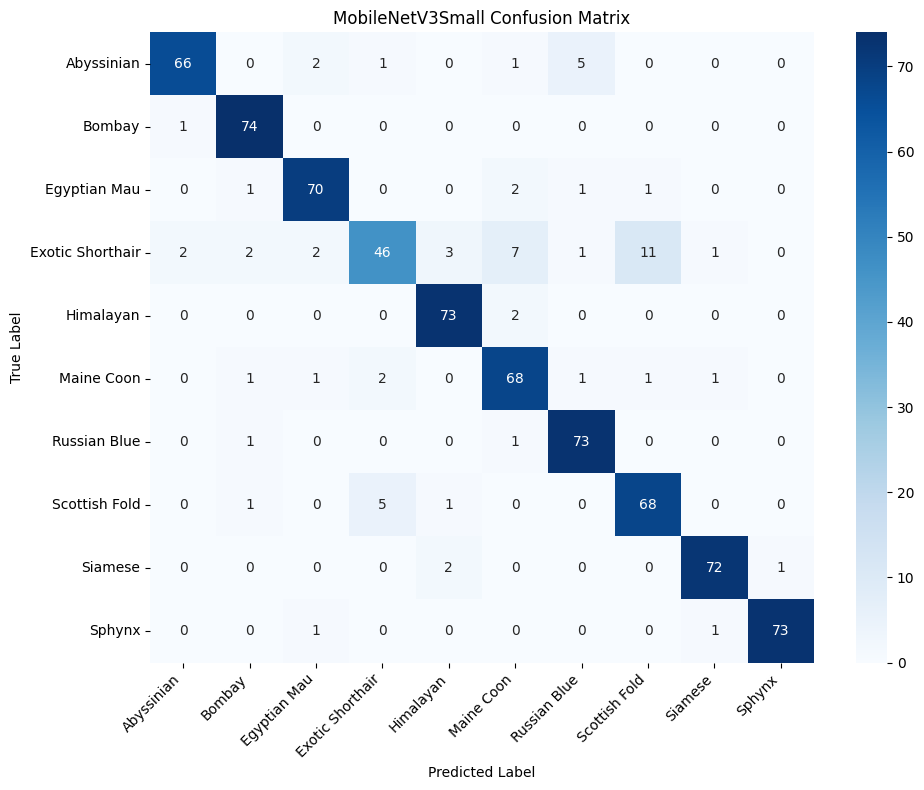


MobileNetV3Small Metrics:
  Test Accuracy: 0.9107
  mAP (macro): 0.9585
  Training Time: 9.90 minutes
  Total Parameters: 944,890


In [12]:
"""## 10. Train MobileNetV3Small"""

mobilenetv3_metrics = train_and_evaluate(
    model_key="mobilenetv3",
    model_label="MobileNetV3Small",
    base_class=MobileNetV3Small,
    preprocess_fn=mobilenetv3_preprocess,
)


STEP 11: COMPARING ALL MODELS

Model Comparison Table:


,Model,Test Accuracy,mAP,Training Time Minutes,Total Parameters,Epochs Completed
0,ResNet50,0.954667,0.991380,72.806595,23608202,50
1,DenseNet121,0.961333,0.988178,66.452128,7047754,50
2,MobileNetV3Small,0.894667,0.956529,9.788656,944890,50


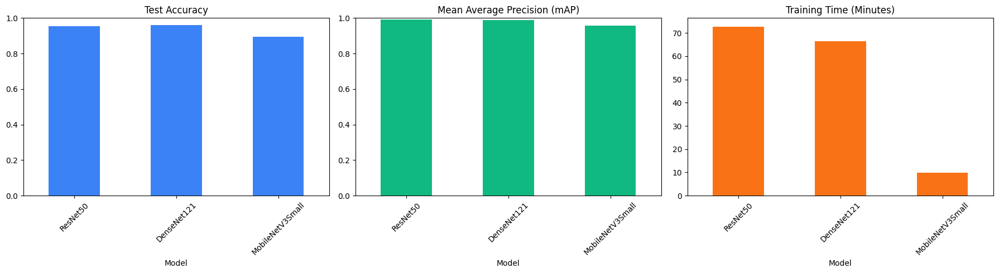


Model comparison chart saved to: project_results\results\graphs\model_comparison.png

KEY FINDINGS:

🏆 Highest Test Accuracy: DenseNet121 (0.9613)
🎯 Highest mAP: ResNet50 (0.9914)
⚡ Fastest Training: MobileNetV3Small (9.79 minutes)


In [13]:
"""## 11. Final Model Comparison"""

print("=" * 60)
print("STEP 11: COMPARING ALL MODELS")
print("=" * 60)

# Collect all metrics from the three trained models
all_metrics = [resnet50_metrics, densenet121_metrics, mobilenetv3_metrics]

# Create comparison DataFrame
comparison_df = pd.DataFrame([
    {
        "Model": item["model"],
        "Test Accuracy": item["test_accuracy"],
        "mAP": item["mean_average_precision_macro"],
        "Training Time Minutes": item["training_time_minutes"],
        "Total Parameters": item["total_params"],
        "Epochs Completed": item["epochs_completed"],
    }
    for item in all_metrics
])

# Save comparison to CSV
comparison_df.to_csv(RESULTS_DIR / "model_comparison.csv", index=False)

print("\nModel Comparison Table:")
display(comparison_df)

# Set Model as index for plotting
display_df = comparison_df.set_index("Model")

# Create three bar charts in one figure
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Chart 1: Test Accuracy
display_df["Test Accuracy"].plot(kind="bar", ax=axes[0], color="#3b82f6")
axes[0].set_title("Test Accuracy")
axes[0].set_ylim(0, 1)
axes[0].tick_params(axis="x", rotation=45)

# Chart 2: Mean Average Precision
display_df["mAP"].plot(kind="bar", ax=axes[1], color="#10b981")
axes[1].set_title("Mean Average Precision (mAP)")
axes[1].set_ylim(0, 1)
axes[1].tick_params(axis="x", rotation=45)

# Chart 3: Training Time
display_df["Training Time Minutes"].plot(kind="bar", ax=axes[2], color="#f97316")
axes[2].set_title("Training Time (Minutes)")
axes[2].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.savefig(GRAPHS_DIR / "model_comparison.png", dpi=150)
plt.show()

print("\nModel comparison chart saved to:", GRAPHS_DIR / "model_comparison.png")

# Print key findings
best_accuracy = comparison_df.sort_values("Test Accuracy", ascending=False).iloc[0]
best_map = comparison_df.sort_values("mAP", ascending=False).iloc[0]
fastest = comparison_df.sort_values("Training Time Minutes", ascending=True).iloc[0]

print("\n" + "=" * 60)
print("KEY FINDINGS:")
print("=" * 60)
print(f"\n🏆 Highest Test Accuracy: {best_accuracy['Model']} ({best_accuracy['Test Accuracy']:.4f})")
print(f"🎯 Highest mAP: {best_map['Model']} ({best_map['mAP']:.4f})")
print(f"⚡ Fastest Training: {fastest['Model']} ({fastest['Training Time Minutes']:.2f} minutes)")


STEP 13: DISPLAYING ALL GENERATED GRAPHS

--- DATASET GRAPHS ---
✓ class_distribution.png


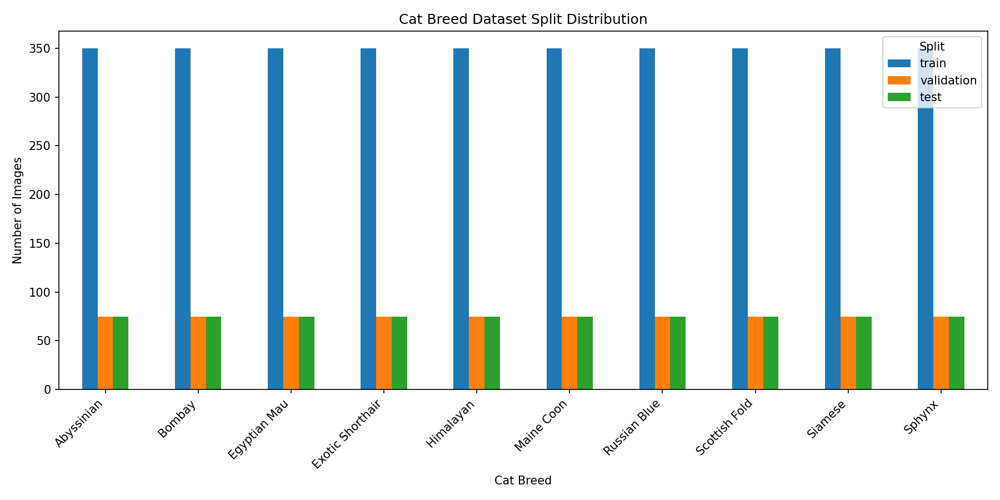

✓ sample_cat_breeds.png


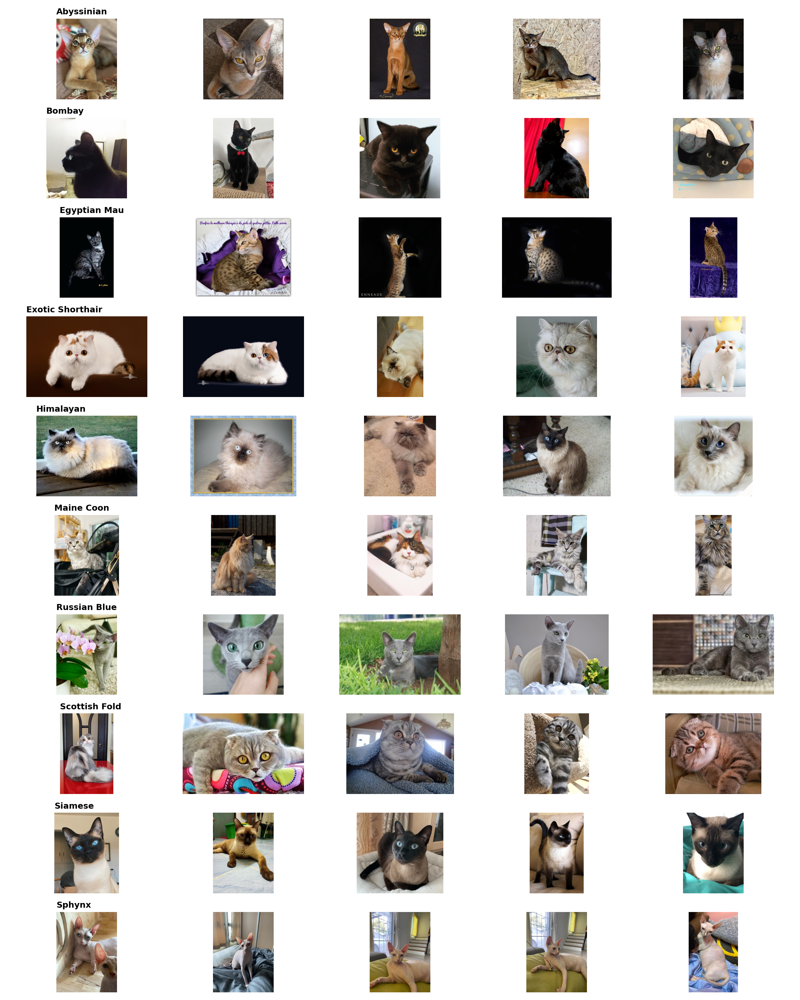


--- TRAINING GRAPHS ---
✓ resnet50_accuracy.png


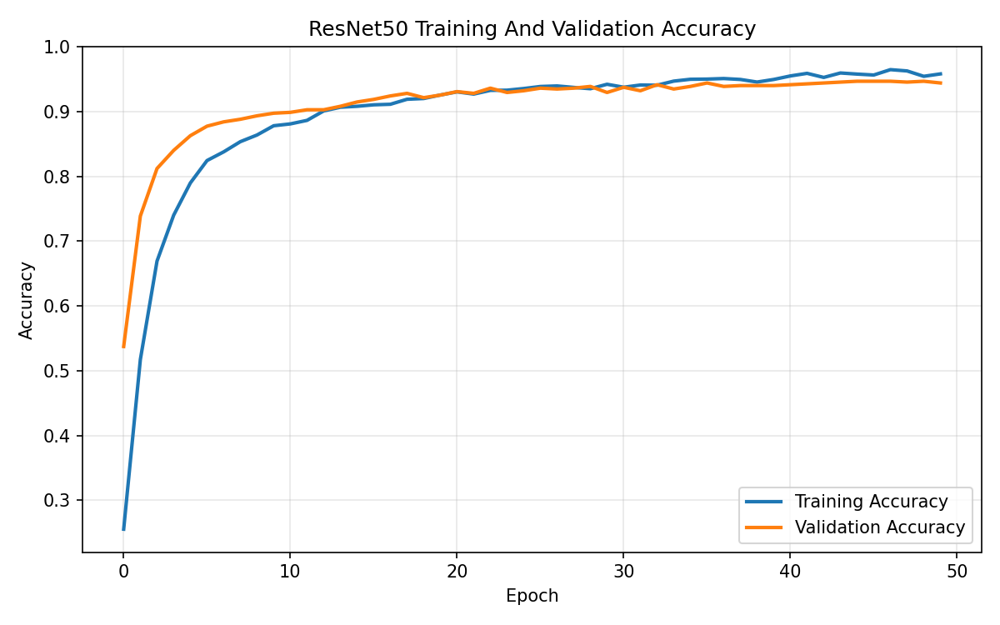

✓ resnet50_loss.png


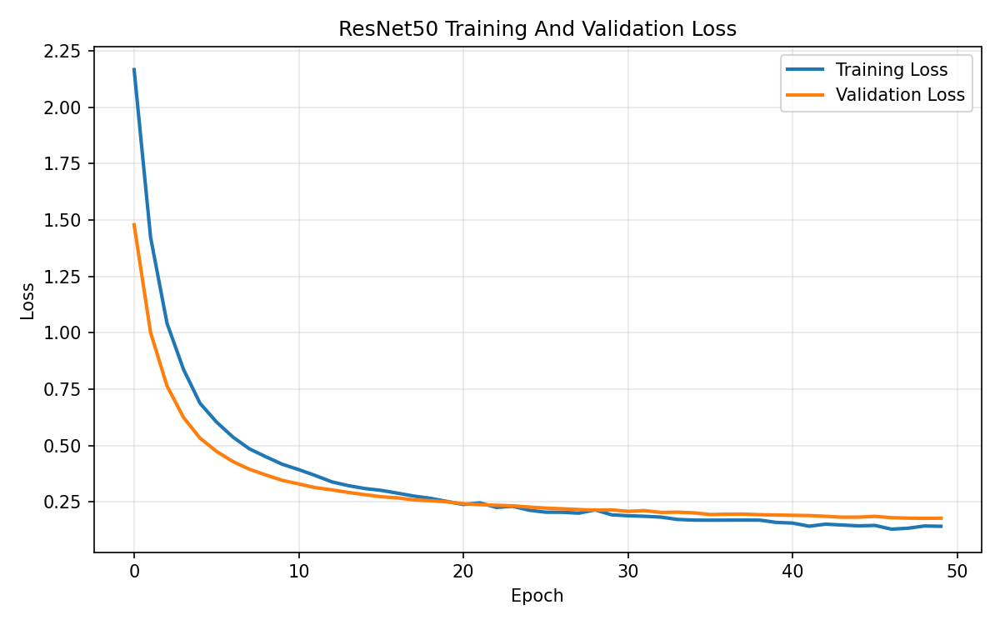

✓ densenet121_accuracy.png


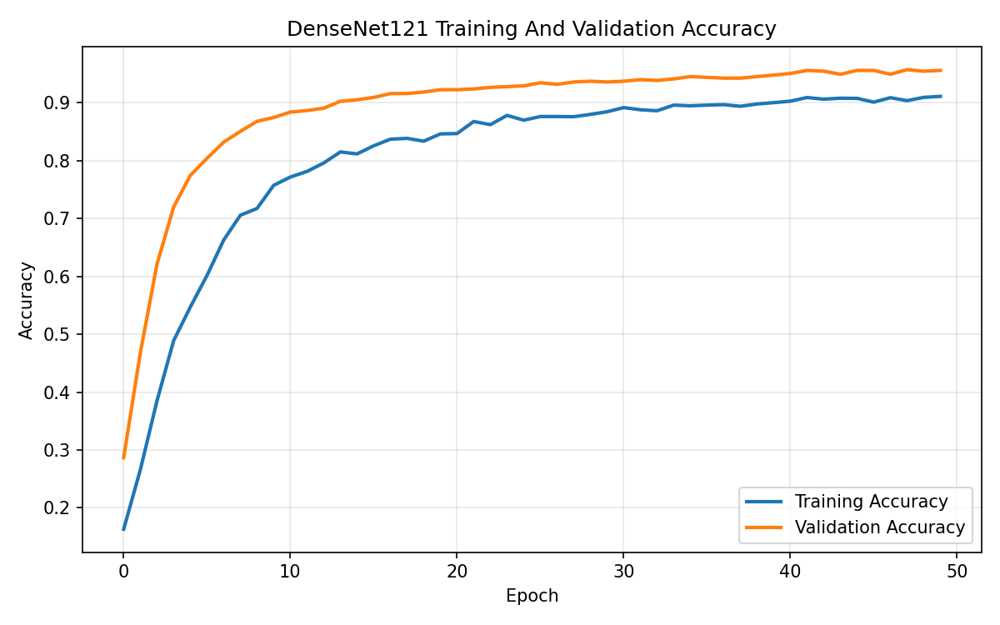

✓ densenet121_loss.png


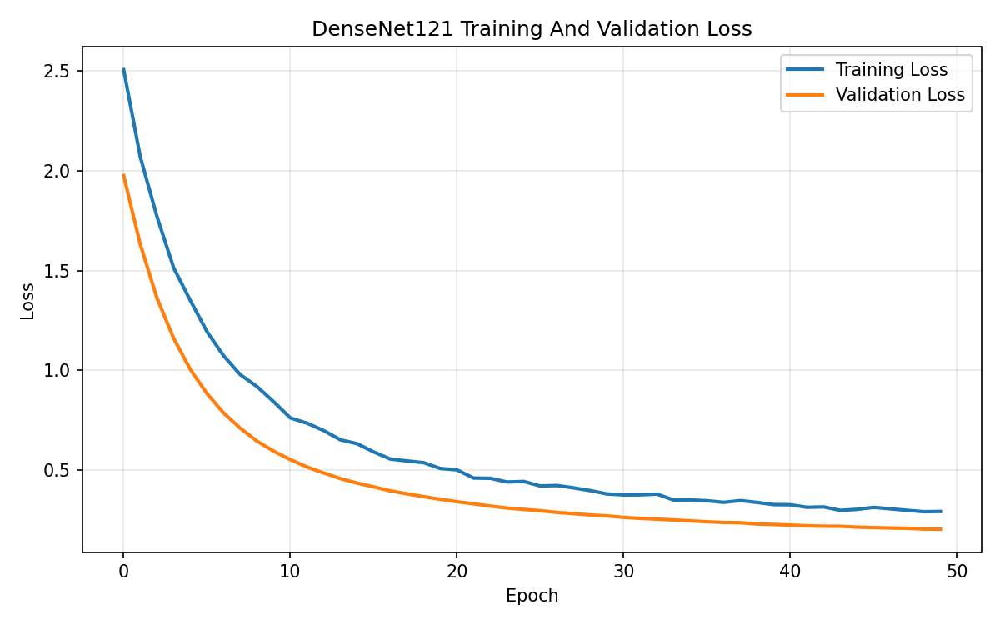

✓ mobilenetv3_accuracy.png


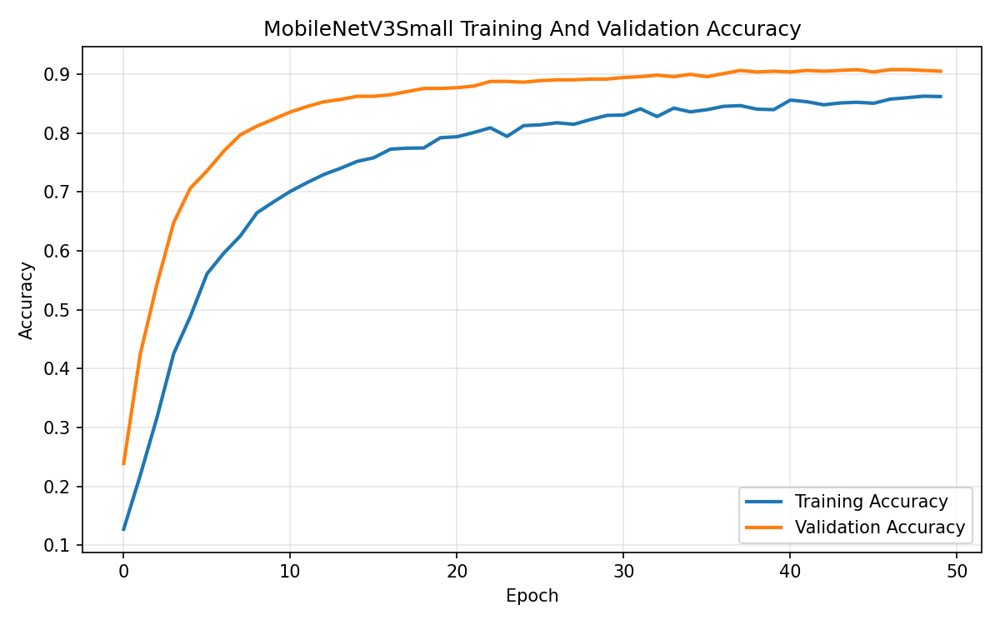

✓ mobilenetv3_loss.png


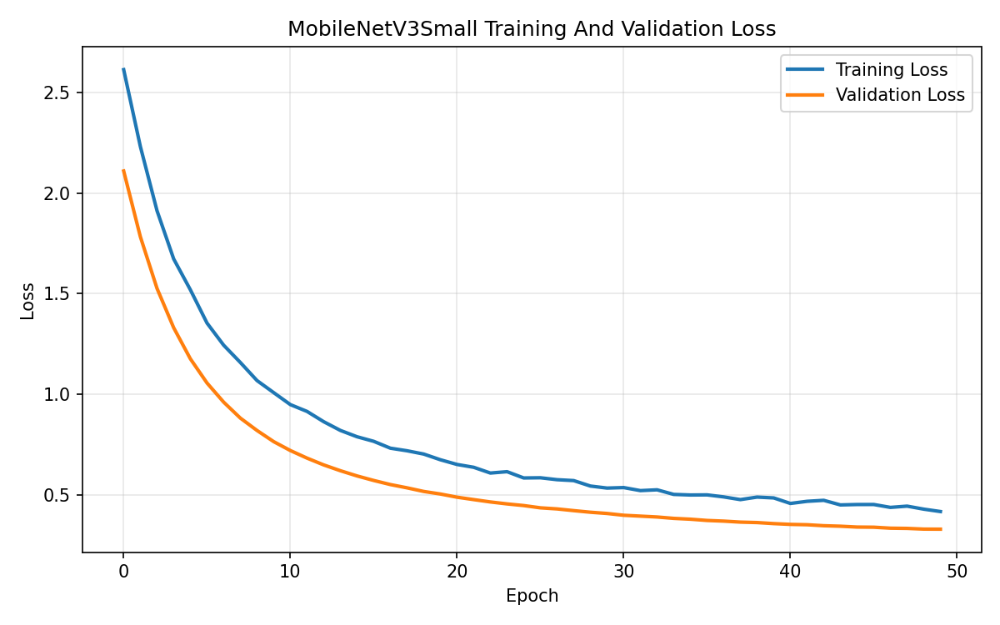


--- CONFUSION MATRICES ---
✓ resnet50_confusion_matrix.png


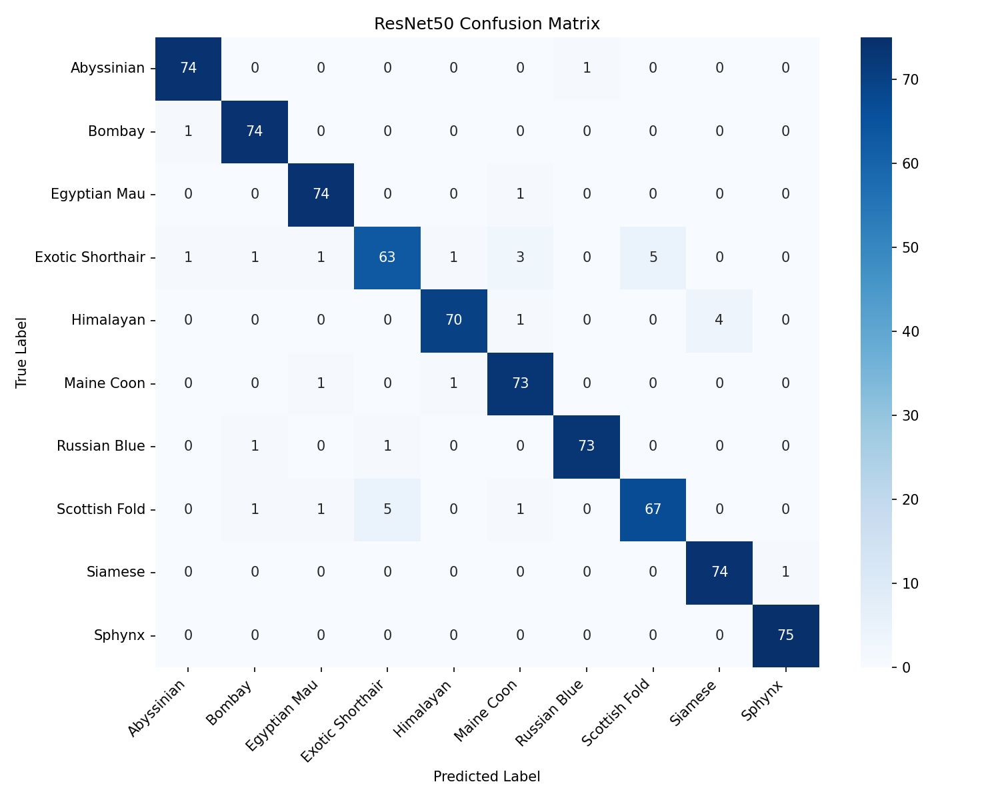

✓ densenet121_confusion_matrix.png


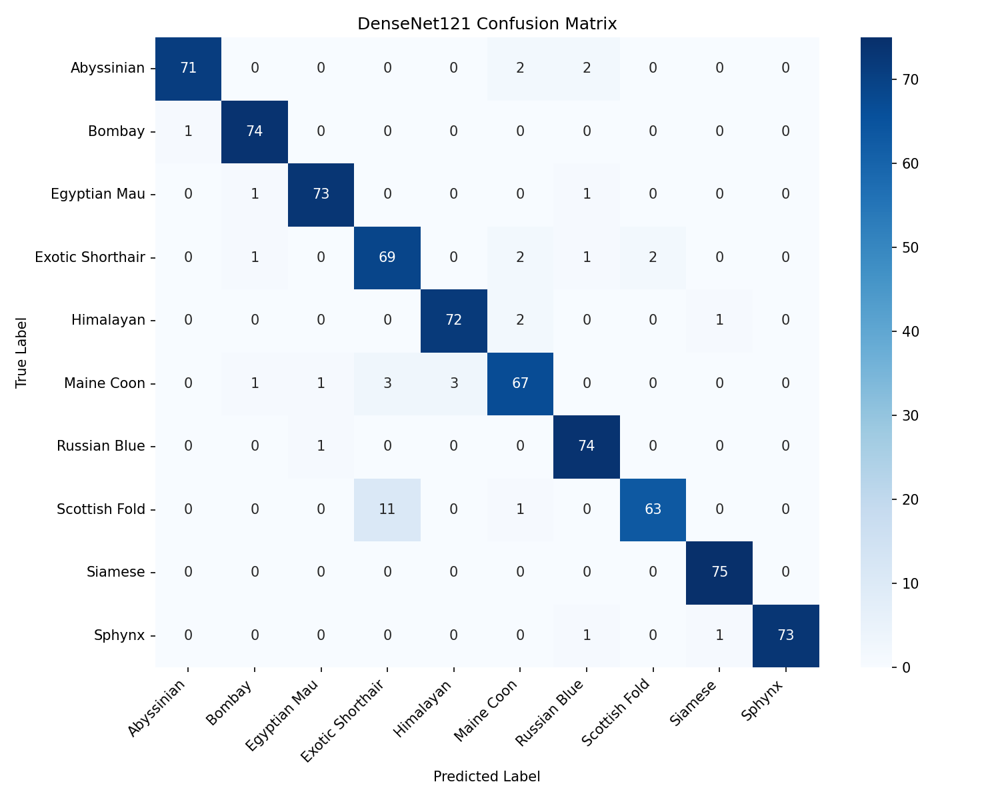

✓ mobilenetv3_confusion_matrix.png


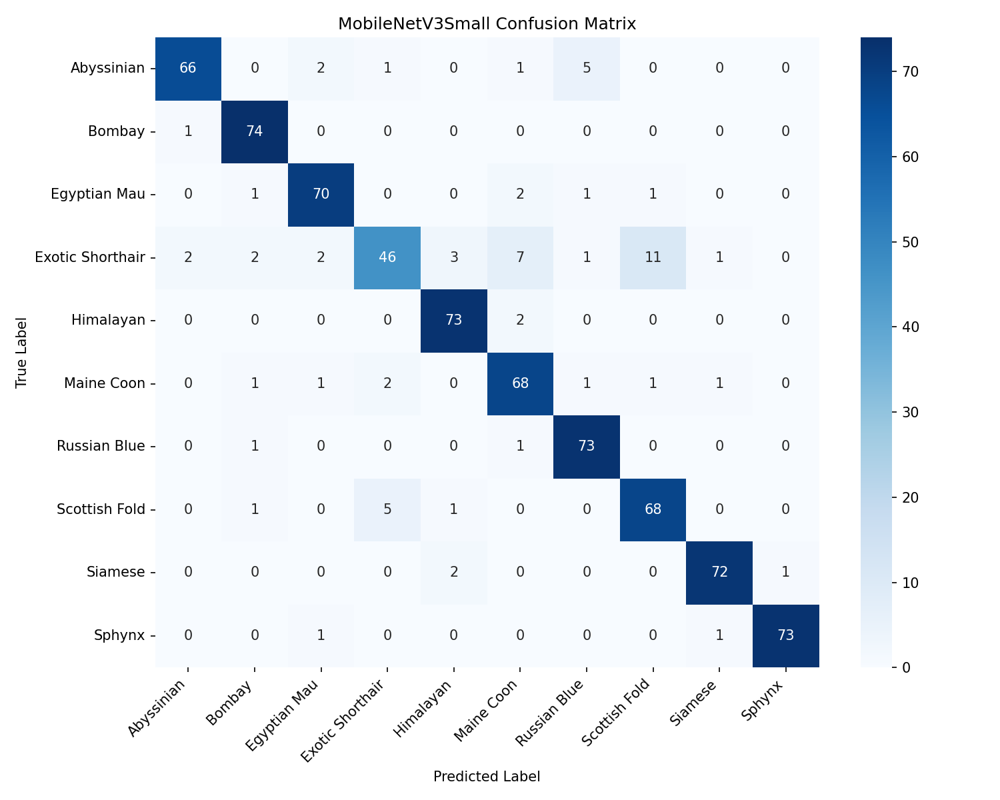


--- MODEL COMPARISON ---


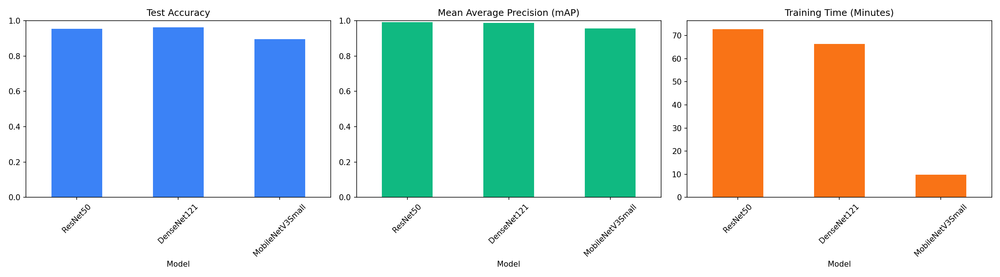

In [16]:
"""## 13. Graph Results Preview For GitHub

Run this section after training. It displays all saved result images inside 
the notebook so they will appear in the output.
"""

print("=" * 60)
print("STEP 13: DISPLAYING ALL GENERATED GRAPHS")
print("=" * 60)

# Dataset Graphs
print("\n--- DATASET GRAPHS ---")
dataset_graphs = [
    GRAPHS_DIR / "class_distribution.png",
    GRAPHS_DIR / "sample_cat_breeds.png",
]

for graph_path in dataset_graphs:
    if graph_path.exists():
        print(f"✓ {graph_path.name}")
        display(DisplayImage(filename=str(graph_path)))
    else:
        print(f"✗ Missing: {graph_path.name}")

# Accuracy And Loss Graphs
print("\n--- TRAINING GRAPHS ---")
training_graphs = [
    GRAPHS_DIR / "resnet50_accuracy.png",
    GRAPHS_DIR / "resnet50_loss.png",
    GRAPHS_DIR / "densenet121_accuracy.png",
    GRAPHS_DIR / "densenet121_loss.png",
    GRAPHS_DIR / "mobilenetv3_accuracy.png",
    GRAPHS_DIR / "mobilenetv3_loss.png",
]

for graph_path in training_graphs:
    if graph_path.exists():
        print(f"✓ {graph_path.name}")
        display(DisplayImage(filename=str(graph_path)))
    else:
        print(f"✗ Missing: {graph_path.name}")

# Confusion Matrices
print("\n--- CONFUSION MATRICES ---")
confusion_matrix_graphs = [
    CONFUSION_DIR / "resnet50_confusion_matrix.png",
    CONFUSION_DIR / "densenet121_confusion_matrix.png",
    CONFUSION_DIR / "mobilenetv3_confusion_matrix.png",
]

for graph_path in confusion_matrix_graphs:
    if graph_path.exists():
        print(f"✓ {graph_path.name}")
        display(DisplayImage(filename=str(graph_path)))
    else:
        print(f"✗ Missing: {graph_path.name}")

# Final Model Comparison Graph
print("\n--- MODEL COMPARISON ---")
comparison_graph = GRAPHS_DIR / "model_comparison.png"

if comparison_graph.exists():
    display(DisplayImage(filename=str(comparison_graph)))
else:
    print(f"✗ Missing: {comparison_graph.name}")


In [ ]:
"""
Final Evaluation: MobileNetV3Small Selection
Model           :  Test Accuracy	mAP	        Training Time Minutes	Total Parameters	Epochs Completed
ResNet50        :  0.954667	        0.991380	72.8	                23,608,202	        50
DenseNet121	    :  0.961333	        0.988178	66.5	                7,047,754	        50
MobileNetV3Small:  0.894667	        0.956529	9.8	                    944,890	            50

1.Performance Analysis
MobileNetV3Small Metrics:
Test Accuracy: 89.47% 
mAP: 95.65% 
Training Time: 9.8 minutes
Parameters: 944,890

2. Why MobileNetV3Small is Chosen:
Key Advantages:
2.1 Training Speed:
-6x faster training (9.8 min vs. ~66-73 minutes for others)
-Enables rapid prototyping and iteration cycles

2.2 Parameter Efficiency:
25x fewer parameters than ResNet50
7.5x fewer parameters than DenseNet121
Drastically reduces memory footprint and inference latency

Trade-off Analysis:
Metric        :	Performance Drop	Benefit Gained
Accuracy      : ~5-7% lower	        Minimal impact on practical use
mAP           : ~3-4% lower	        Still 95.65% - excellent precision/recall balance
Training Time : N/A	                86% time savings
Parameters    :	N/A	                24x reduction → edge deployment ready
Final Conclusion:
MobileNetV3Small is the best suited model for this cat breed classification task. While it shows 
a small accuracy drop (~5-7%), the benefits are substantial: 6x faster training, massive cost savings 
in compute resources, and instant deployment capabilities on edge devices. This describes 
MobileNetV3Small's value proposition—delivering 89.47% accuracy with minimal computational 
overhead while enabling real-world mobile/edge deployment that larger models cannot match.
"""